In [1]:
import os
import glob as glob
import matplotlib.pyplot as plt
import cv2
import requests
import random
import numpy as np
from google.colab.patches import cv2_imshow
import pandas as pd

SEED = 42
np.random.seed(SEED)

In [2]:
!git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 16549, done.
remote: Counting objects: 100% (27/27), done.
remote: Compressing objects: 100% (27/27), done.
remote: Total 16549 (delta 13), reused 3 (delta 0), pack-reused 16522
Receiving objects: 100% (16549/16549), 15.08 MiB | 8.59 MiB/s, done.
Resolving deltas: 100% (11370/11370), done.


In [2]:
TRAIN = True
EPOCHS = 3

In [5]:
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/

In [6]:
import shutil
import os

if not os.path.exists('/root/.kaggle/kaggle.json'):
    shutil.move('/content/kaggle.json', '/root/.kaggle/kaggle.json')

In [7]:
!kaggle competitions download -c ee5178-mcv-project

 99% 3.24G/3.26G [00:41<00:00, 106MB/s]
100% 3.26G/3.26G [00:41<00:00, 84.2MB/s]


In [8]:
!unzip ee5178-mcv-project.zip -d data

Streaming output truncated to the last 5000 lines.
  inflating: data/final_data/train_dark/labels/56300e18-3d11-4fb3-a82f-ba9ec58be9c7.txt  
  inflating: data/final_data/train_dark/labels/563b6433-0cf6-4047-9d76-6afb3a049be9.txt  
  inflating: data/final_data/train_dark/labels/564465a2-3c8a-4609-ba0b-5a8d801ed035.txt  
  inflating: data/final_data/train_dark/labels/564fa263-0381-4a11-b663-002128f2cc03.txt  
  inflating: data/final_data/train_dark/labels/564fd490-dc21-40b6-be43-3273e810cd3d.txt  
  inflating: data/final_data/train_dark/labels/56588e53-f9f2-414e-ae52-c5b681205d4d.txt  
  inflating: data/final_data/train_dark/labels/56608876-e817-4e8f-8d3d-4d949249c6bc.txt  
  inflating: data/final_data/train_dark/labels/5672b2e4-ee11-4c8e-b0b4-30947ee6814d.txt  
  inflating: data/final_data/train_dark/labels/567d7945-dcc4-479f-bf41-584de39b59d9.txt  
  inflating: data/final_data/train_dark/labels/5682c6b6-28ff-4b63-9ced-62763c2188f0.txt  
  inflating: data/final_data/train_dark/labels/56

In [3]:
class_names = ['aegypti', 'albopictus', 'anopheles', 'culex', 'culiseta', 'japonicus/koreicus']
colors = np.random.uniform(0, 255, size=(len(class_names), 3))

In [4]:
labels_path = '/content/data/final_data/train_dark/labels'

labels_array = []

for file_name in os.listdir(labels_path):
  if file_name.endswith('.txt'):
    label_file_path = os.path.join(labels_path, file_name)
    with open(label_file_path, 'r') as file:
      content = file.read()
      numbers = [float(num) for num in content.split()]
      labels_array.append(numbers)

In [5]:
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[1]-bboxes[3]/2, bboxes[2]-bboxes[4]/2
    xmax, ymax = bboxes[1]+bboxes[3]/2, bboxes[2]+bboxes[4]/2
    return xmin, ymin, xmax, ymax

In [6]:
def plot_box(image, box):
  h, w, _ = image.shape
  x1, y1, x2, y2 = yolo2bbox(box)
  xmin = int(x1*w)
  ymin = int(y1*h)
  xmax = int(x2*w)
  ymax = int(y2*h)
  width = xmax - xmin
  height = ymax - ymin

  class_name = class_names[int(box[0])]

  cv2.rectangle(
      image,
      (xmin, ymin), (xmax, ymax),
      color=colors[class_names.index(class_name)],
      thickness=2
  )
  font_scale = min(1,max(3,int(w/500)))
  font_thickness = min(2, max(10,int(w/50)))

  p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))
  tw, th = cv2.getTextSize(
      class_name,
       0, fontScale=font_scale, thickness=font_thickness
  )[0]
  p2 = p1[0] + tw, p1[1] + -th - 10
  cv2.rectangle(
      image,
      p1, p2,
      color=colors[class_names.index(class_name)],
      thickness=-1,
  )
  cv2.putText(
      image,
      class_name,
      (xmin+1, ymin-10),
      cv2.FONT_HERSHEY_SIMPLEX,
      font_scale,
      (255, 255, 255),
      font_thickness
  )
  return image

In [7]:
def plot(image_paths, labels_array, num_samples):
    all_training_images = glob.glob(image_paths)
    num_images = len(all_training_images)

    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        j = random.randint(0,num_images-1)
        image = cv2.imread(all_training_images[j])
        result_image = plot_box(image, labels_array[j])
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    plt.subplots_adjust(wspace=0)
    plt.tight_layout()
    plt.show()

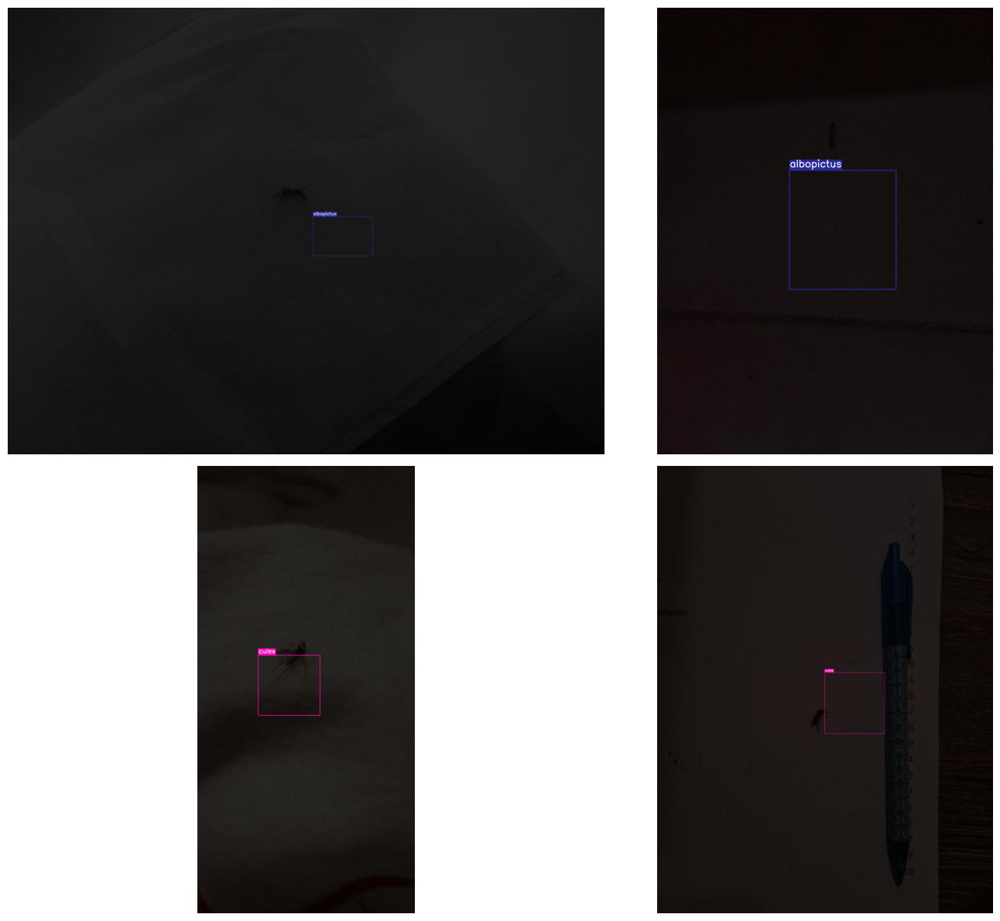

In [8]:
plot('/content/data/final_data/train_dark/images/*', labels_array, num_samples=4)

In [9]:
def set_res_dir():
    # Directory to store results
    res_dir_count = len(glob.glob('/content/runs/train/*'))
    print(f"Current number of result directories: {res_dir_count}")
    if TRAIN:
        RES_DIR = f"results_{res_dir_count+1}"
        print(RES_DIR)
    else:
        RES_DIR = f"results_{res_dir_count}"
    return RES_DIR

In [10]:
def monitor_tensorboard():
    %load_ext tensorboard
    %tensorboard --logdir /content/runs/train

In [11]:
%cd yolov5/
!pwd

/content/yolov5
/content/yolov5


In [18]:
!pip install -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 20.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 750.4/750.4 kB 28.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.3 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_

In [22]:
monitor_tensorboard()

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1486), started 1:38:00 ago. (Use '!kill 1486' to kill it.)

<IPython.core.display.Javascript object>

In [13]:
data_yaml = """
train: /content/data/final_data/train_dark/images
val: /content/data/final_data/val_dark/images

nc: 6
names: ['aegypti', 'albopictus', 'anopheles', 'culex', 'culiseta', 'japonicus/koreicus']
"""

with open('/content/data/data.yaml', 'w') as file:
    file.write(data_yaml)

In [14]:
import os
import shutil

# Define paths
train_images_dir = '/content/data/final_data/train_dark/images'  # Path to your training images directory
train_labels_dir = '/content/data/final_data/train_dark/labels'  # Path to your training labels directory
val_images_dir = '/content/data/final_data/val_dark/images'  # Path to create the validation images directory
val_labels_dir = '/content/data/final_data/val_dark/labels'  # Path to create the validation labels directory
val_ratio = 0.1  # Ratio of images to move to validation directory

# Create the validation directories if they don't exist
os.makedirs(val_images_dir, exist_ok=True)
os.makedirs(val_labels_dir, exist_ok=True)

# Get a list of all image files in the training directory
image_files = [file for file in os.listdir(train_images_dir) if file.endswith(('.jpeg'))]

# Calculate the number of images to move to the validation directory
num_val_images = int(len(image_files) * val_ratio)

# Move a portion of the images and their corresponding labels to the validation directory
for i in range(num_val_images):
    image_src = os.path.join(train_images_dir, image_files[i])
    label_src = os.path.join(train_labels_dir, image_files[i].replace('.jpeg', '.txt'))  # Assuming label files have the same name as image files but with .txt extension
    image_dst = os.path.join(val_images_dir, image_files[i])
    label_dst = os.path.join(val_labels_dir, image_files[i].replace('.jpeg', '.txt'))  # Adjust the extension as necessary
    shutil.move(image_src, image_dst)
    shutil.move(label_src, label_dst)

print(f"{num_val_images} images and their corresponding labels moved to the validation directory.")


750 images and their corresponding labels moved to the validation directory.


In [15]:
RES_DIR = set_res_dir()
if TRAIN:
    !python train.py --data /content/data/data.yaml --weights yolov5s.pt \
    --img 300 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR}

Current number of result directories: 0
results_1
2024-04-14 14:11:20.242014: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-14 14:11:20.242066: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-14 14:11:20.243719: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/data/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=3, batch_size=16, imgsz=300, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_wei

In [16]:
def show_valid_results(RES_DIR):
    !ls runs/train/{RES_DIR}
    EXP_PATH = f"runs/train/{RES_DIR}"
    validation_pred_images = glob.glob(f"{EXP_PATH}/*_pred.jpg")
    print(validation_pred_images)
    for pred_image in validation_pred_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

In [34]:
# Helper function for inference on images.
def inference(RES_DIR, data_path):
    # Directory to store inference results.
    infer_dir_count = len(glob.glob('runs/detect/*'))
    print(f"Current number of inference detection directories: {infer_dir_count}")
    INFER_DIR = f"inference_{infer_dir_count+1}"
    print(INFER_DIR)
    # Inference on images.
    !python detect.py --weights runs/train/{RES_DIR}/weights/best.pt \
    --source {data_path} --name {INFER_DIR}
    return INFER_DIR

In [18]:
def visualize(INFER_DIR):
# Visualize inference images.
    INFER_PATH = f"runs/detect/{INFER_DIR}"
    infer_images = glob.glob(f"{INFER_PATH}/*.jpg")
    print(infer_images)
    for pred_image in infer_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

confusion_matrix.png				    PR_curve.png	   val_batch0_pred.jpg
events.out.tfevents.1713103884.666e48f81331.1560.0  R_curve.png		   val_batch1_labels.jpg
F1_curve.png					    results.csv		   val_batch1_pred.jpg
hyp.yaml					    results.png		   val_batch2_labels.jpg
labels_correlogram.jpg				    train_batch0.jpg	   val_batch2_pred.jpg
labels.jpg					    train_batch1.jpg	   weights
opt.yaml					    train_batch2.jpg
P_curve.png					    val_batch0_labels.jpg
['runs/train/results_1/val_batch0_pred.jpg', 'runs/train/results_1/val_batch2_pred.jpg', 'runs/train/results_1/val_batch1_pred.jpg']


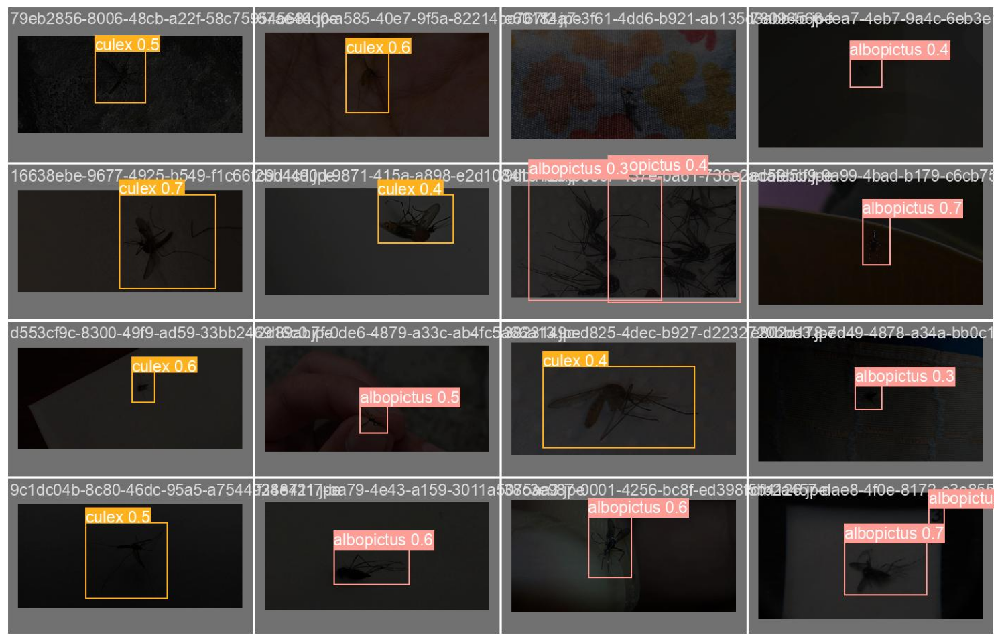

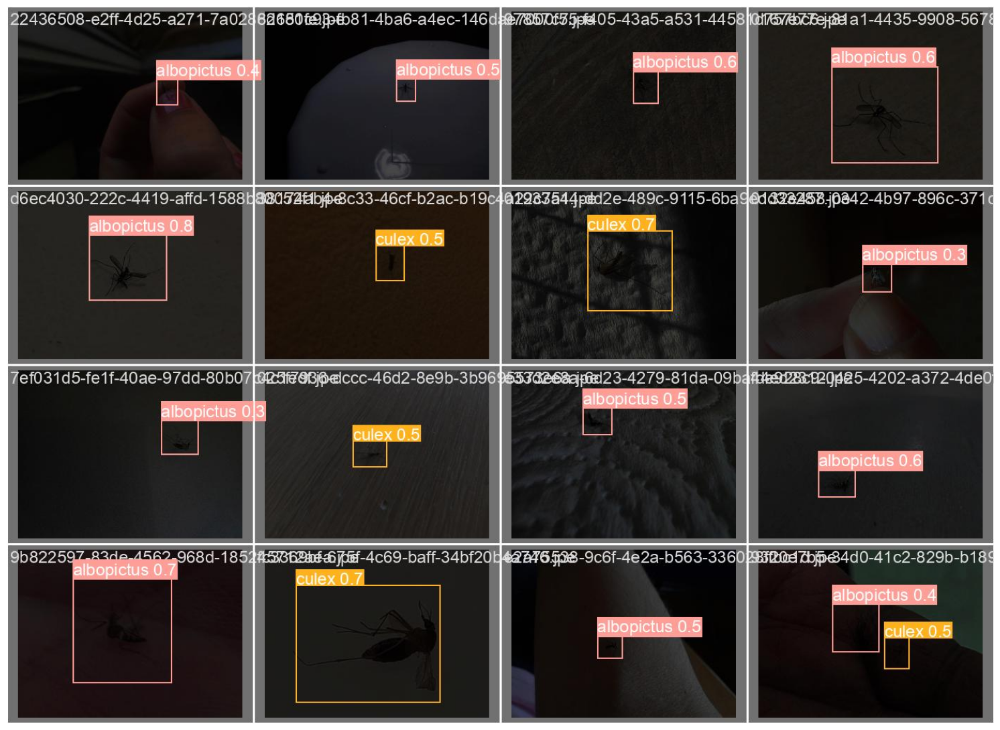

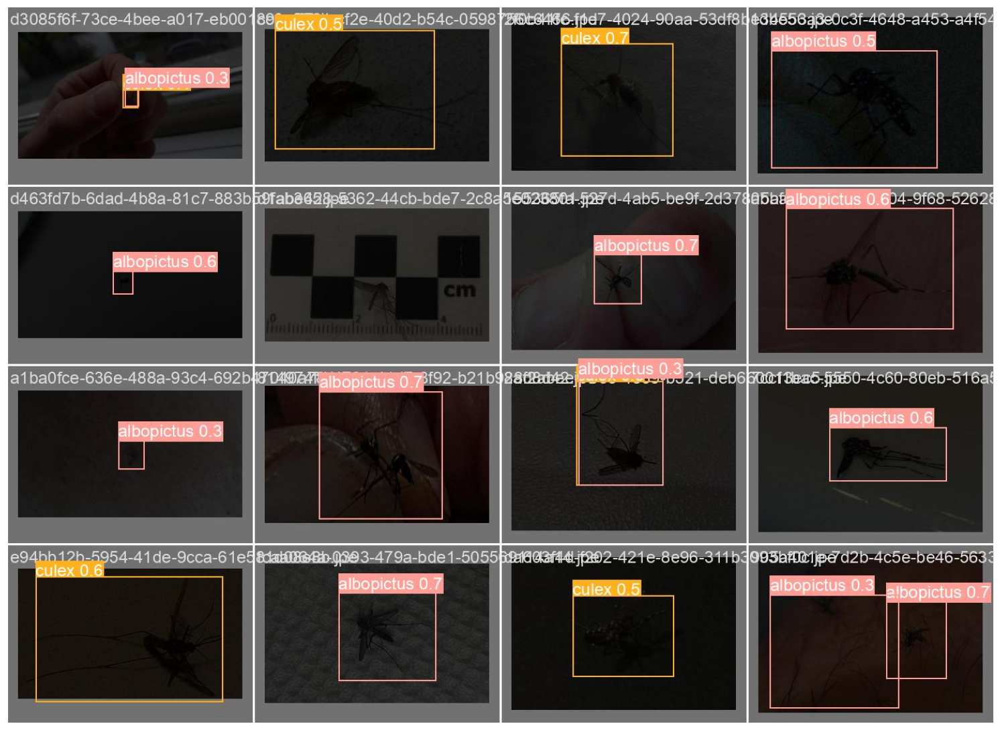

In [19]:
show_valid_results(RES_DIR)

In [35]:
IMAGE_INFER_DIR = inference(RES_DIR, '/content/data/final_data/test_dark/images')

Current number of inference detection directories: 2
inference_3
usage: detect.py [-h] [--weights WEIGHTS [WEIGHTS ...]] [--source SOURCE] [--data DATA]
                 [--imgsz IMGSZ [IMGSZ ...]] [--conf-thres CONF_THRES] [--iou-thres IOU_THRES]
                 [--max-det MAX_DET] [--device DEVICE] [--view-img] [--save-txt] [--save-csv]
                 [--save-conf] [--save-crop] [--nosave] [--classes CLASSES [CLASSES ...]]
                 [--agnostic-nms] [--augment] [--visualize] [--update] [--project PROJECT]
                 [--name NAME] [--exist-ok] [--line-thickness LINE_THICKNESS] [--hide-labels]
                 [--hide-conf] [--half] [--dnn] [--vid-stride VID_STRIDE]
detect.py: error: unrecognized arguments: inference_3/det.csv


In [21]:
visualize(IMAGE_INFER_DIR)

[]


In [24]:
import shutil
import os

# Define the paths
source_dir = '/content/yolov5/runs/detect/inference_1'  # Source directory
zip_file_path = '/content/inference_1.zip'  # Path to the zip file

# Create a zip file of the directory
shutil.make_archive('/content/inference_1', 'zip', source_dir)

# Move the zip file to a desired location
shutil.move('/content/inference_1.zip', zip_file_path)

# Download the zip file
from google.colab import files
files.download(zip_file_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [29]:
!python detect.py --weights /content/yolov5/runs/train/results_1/weights/best.pt --save-txt det.txt

usage: detect.py [-h] [--weights WEIGHTS [WEIGHTS ...]] [--source SOURCE] [--data DATA]
                 [--imgsz IMGSZ [IMGSZ ...]] [--conf-thres CONF_THRES] [--iou-thres IOU_THRES]
                 [--max-det MAX_DET] [--device DEVICE] [--view-img] [--save-txt] [--save-csv]
                 [--save-conf] [--save-crop] [--nosave] [--classes CLASSES [CLASSES ...]]
                 [--agnostic-nms] [--augment] [--visualize] [--update] [--project PROJECT]
                 [--name NAME] [--exist-ok] [--line-thickness LINE_THICKNESS] [--hide-labels]
                 [--hide-conf] [--half] [--dnn] [--vid-stride VID_STRIDE]
detect.py: error: unrecognized arguments: det.txt
